# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Conv2D,Flatten,Dropout,MaxPool2D,Dense
from keras.preprocessing.image import ImageDataGenerator

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Open Folders

In [2]:
trainpath = '../input/intel-image-classification/seg_train/'
testpath = '../input/intel-image-classification/seg_test/'
predpath = '../input/intel-image-classification/seg_pred/'

In [3]:
for folder in os.listdir(trainpath + 'seg_train'):
    files = gb.glob(pathname= str(trainpath + 'seg_train//'+folder+'/*.jpg'))
    print(f"for training data, found {len(files)} in folder {folder}")

for training data, found 2512 in folder mountain
for training data, found 2382 in folder street
for training data, found 2191 in folder buildings
for training data, found 2274 in folder sea
for training data, found 2271 in folder forest
for training data, found 2404 in folder glacier


In [4]:
for folder in os.listdir(testpath + 'seg_test'):
    files = gb.glob(pathname= str(testpath + 'seg_test//'+folder+'/*.jpg'))
    print(f"for testing data, found {len(files)} in folder {folder}")

for testing data, found 525 in folder mountain
for testing data, found 501 in folder street
for testing data, found 437 in folder buildings
for testing data, found 510 in folder sea
for testing data, found 474 in folder forest
for testing data, found 553 in folder glacier


In [5]:
files = gb.glob(pathname= str(predpath + 'seg_pred'+'/*.jpg'))
print(f"for predicting data, found {len(files)} image")

for predicting data, found 7301 image


# View Shapes of the images

In [6]:
codes = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(c):
    for key, val in codes.items():
        if c == val:
            return key

In [7]:
size = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(111, 150, 3)        3
(135, 150, 3)        3
(143, 150, 3)        2
(108, 150, 3)        2
(146, 150, 3)        2
(142, 150, 3)        2
(123, 150, 3)        2
(136, 150, 3)        2
(134, 150, 3)        2
(144, 150, 3)        2
(81, 150, 3)         1
(149, 150, 3)        1
(119, 150, 3)        1
(76, 150, 3)         1
(120, 150, 3)        1
(97, 150, 3)         1
(105, 150, 3)        1
(141, 150, 3)        1
(110, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(145, 150, 3)        1
(140, 150, 3)        1
(124, 150, 3)        1
(103, 150, 3)        1
(100, 150, 3)        1
(131, 150, 3)        1
(147, 150, 3)        1
(102, 150, 3)        1
dtype: int64

In [8]:
size = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(81, 150, 3)        1
(131, 150, 3)       1
(141, 150, 3)       1
(149, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(72, 150, 3)        1
dtype: int64

In [9]:
size=[]
files = gb.glob(pathname= str(predpath + 'seg_pred'+'/*.jpg'))
for file in files:
    image=cv2.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(139, 150, 3)       1
(108, 150, 3)       1
(129, 150, 3)       1
(143, 150, 3)       1
(149, 150, 3)       1
(144, 150, 3)       1
(133, 150, 3)       1
(112, 150, 3)       1
(100, 150, 3)       1
(374, 500, 3)       1
(126, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
dtype: int64

In [10]:
s=100

# Read Images

In [11]:
x_train=[]
y_train=[]

for folder in os.listdir(trainpath+'seg_train'):
    files= gb.glob(pathname=str(trainpath+'seg_train//'+folder+'/*.jpg'))
    for file in files:
        image=cv2.imread(file)
        image_array=cv2.resize(image,(s,s))
        x_train.append(list(image_array))
        y_train.append(codes[folder])

In [12]:
print(f'we have {len(x_train)} items in X_train')

we have 14034 items in X_train


In [13]:
#list(np.random.randint(0,len(x_train),36))

getcode(y_train[3])

'mountain'

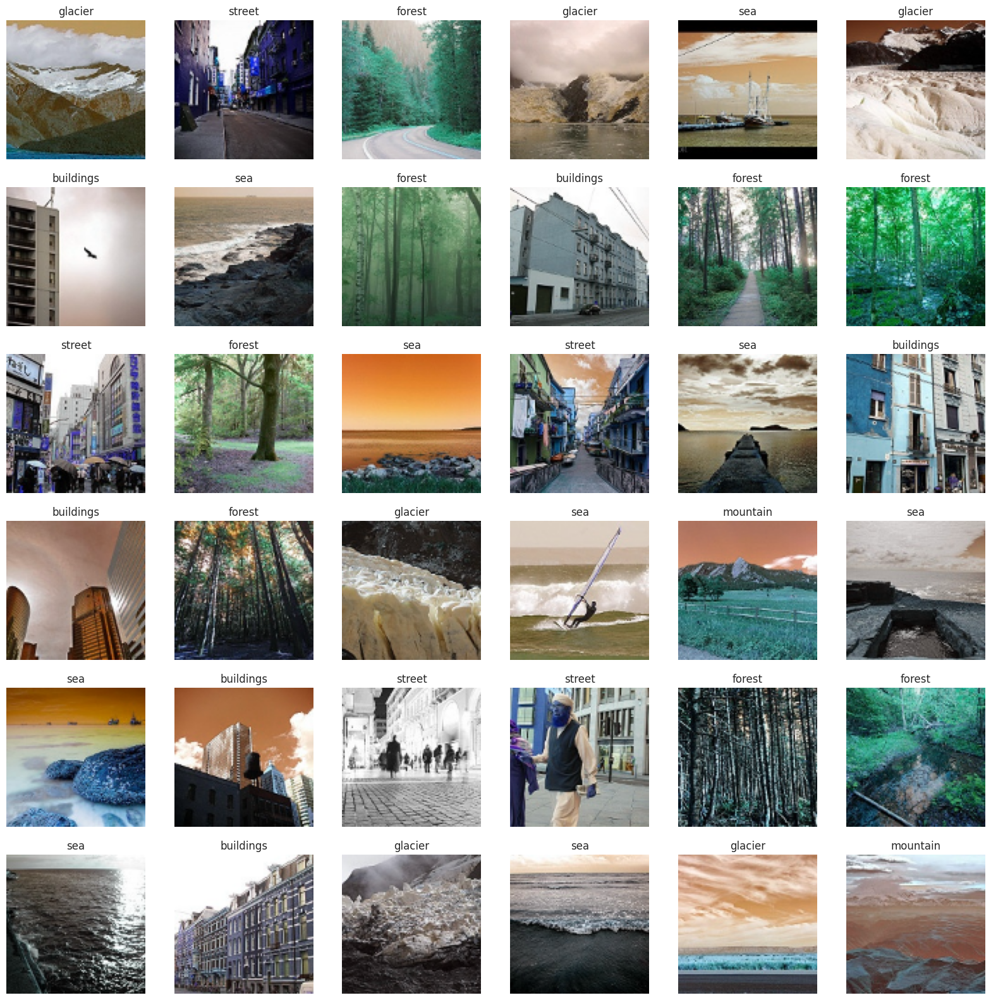

In [14]:
plt.figure(figsize=(20,20))
for n, i in enumerate(list(np.random.randint(0,len(x_train),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_train[i])
    plt.title(getcode(y_train[i]))
    plt.axis('off')


In [15]:
x_test=[]
y_test=[]

for folder in os.listdir(testpath+'seg_test'):
    files= gb.glob(pathname=str(testpath+'seg_test//'+folder+'/*.jpg'))
    for file in files:
        image=cv2.imread(file)
        image_array=cv2.resize(image,(s,s))
        x_test.append(list(image_array))
        y_test.append(codes[folder])

In [16]:
print(f'we have {len(x_test)} items in X_test')

we have 3000 items in X_test


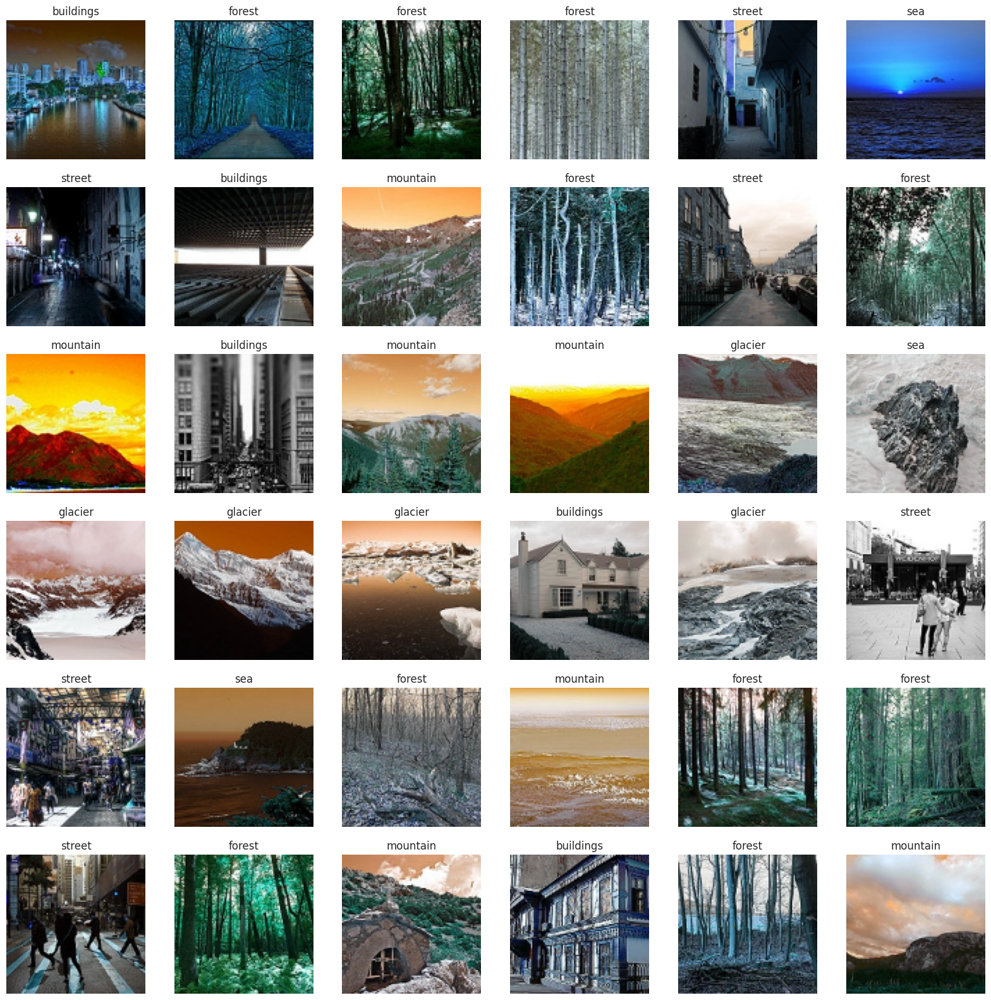

In [17]:
plt.figure(figsize=(20,20))
for n, i in enumerate(list(np.random.randint(0,len(x_test),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_test[i])
    plt.title(getcode(y_test[i]))
    plt.axis('off')


In [18]:
x_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    x_pred.append(list(image_array))       

In [19]:
print(f'we have {len(x_pred)} items in X_pred')

we have 7301 items in X_pred


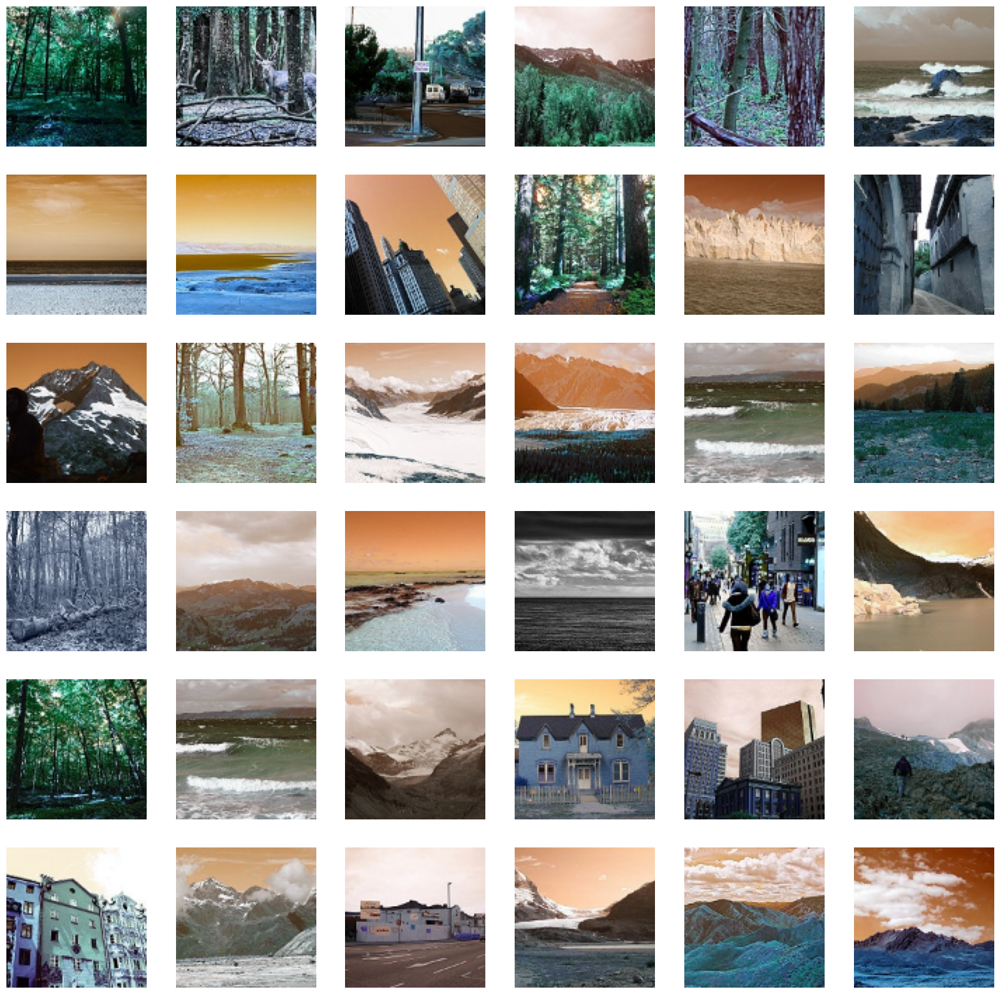

In [20]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(x_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])    
    plt.axis('off')

# Building CNN Model

In [21]:
x_train = np.array(x_train)
x_test = np.array(x_test)
x_pred_array = np.array(x_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {x_train.shape}')
print(f'X_test shape  is {x_test.shape}')
print(f'X_pred shape  is {x_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


In [22]:
model = Sequential([
        Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        Conv2D(150,kernel_size=(3,3),activation='relu'),
        MaxPool2D(4,4),
        Conv2D(120,kernel_size=(3,3),activation='relu'),    
        Conv2D(80,kernel_size=(3,3),activation='relu'),    
        Conv2D(50,kernel_size=(3,3),activation='relu'),
        MaxPool2D(4,4),
        Flatten() ,    
        Dense(120,activation='relu') ,    
        Dense(100,activation='relu') ,    
        Dense(50,activation='relu') ,        
        Dropout(rate=0.5) ,            
        Dense(6,activation='softmax') ,    
        ])

In [23]:
model.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [24]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 200)       5600      
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 150)       270150    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 150)      0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 120)       162120    
                                                                 
 conv2d_3 (Conv2D)           (None, 20, 20, 80)        86480     
                                                                 
 conv2d_4 (Conv2D)           (None, 18, 18, 50)        36050     
                                   

In [25]:
epochs = 50
keras_model = model.fit(x_train, y_train, epochs=epochs,batch_size=64,verbose=1,validation_data=(x_test,y_test))

Epoch 1/50
220/220 [==============================] - 68s 210ms/step - loss: 1.5436 - accuracy: 0.4062 - val_loss: 1.0637 - val_accuracy: 0.5613
Epoch 2/50
220/220 [==============================] - 45s 206ms/step - loss: 1.0972 - accuracy: 0.5604 - val_loss: 1.0172 - val_accuracy: 0.5917
Epoch 3/50
220/220 [==============================] - 43s 196ms/step - loss: 0.9721 - accuracy: 0.6137 - val_loss: 0.8338 - val_accuracy: 0.6827
Epoch 4/50
220/220 [==============================] - 43s 194ms/step - loss: 0.8648 - accuracy: 0.6804 - val_loss: 0.7236 - val_accuracy: 0.7333
Epoch 5/50
220/220 [==============================] - 43s 194ms/step - loss: 0.7604 - accuracy: 0.7354 - val_loss: 0.8220 - val_accuracy: 0.6927
Epoch 6/50
220/220 [==============================] - 43s 194ms/step - loss: 0.7185 - accuracy: 0.7396 - val_loss: 0.7044 - val_accuracy: 0.7517
Epoch 7/50
220/220 [==============================] - 43s 194ms/step - loss: 0.6561 - accuracy: 0.7735 - val_loss: 0.6588 - val_ac

# Evaluation

In [26]:
loss, accuracy = model.evaluate(x_test, y_test)

print('Test Loss is {}'.format(loss))
print('Test Accuracy is {}'.format(accuracy ))

94/94 [==============================] - 6s 41ms/step - loss: 1.3187 - accuracy: 0.8047
Test Loss is 1.3187384605407715
Test Accuracy is 0.8046666383743286


In [27]:
y_pred = model.predict(x_test)

print('Prediction Shape is {}'.format(y_pred.shape))

94/94 [==============================] - 3s 26ms/step
Prediction Shape is (3000, 6)


In [28]:
y_result = model.predict(x_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

229/229 [==============================] - 6s 28ms/step
Prediction Shape is (7301, 6)


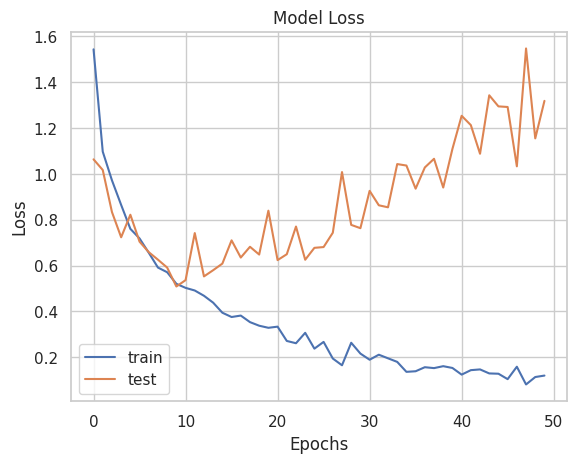

In [29]:
plt.plot(keras_model.history['loss'])
plt.plot(keras_model.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

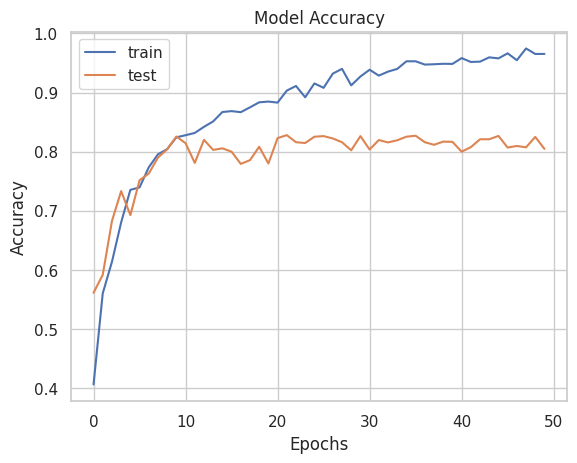

In [30]:
plt.plot(keras_model.history['accuracy'])
plt.plot(keras_model.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

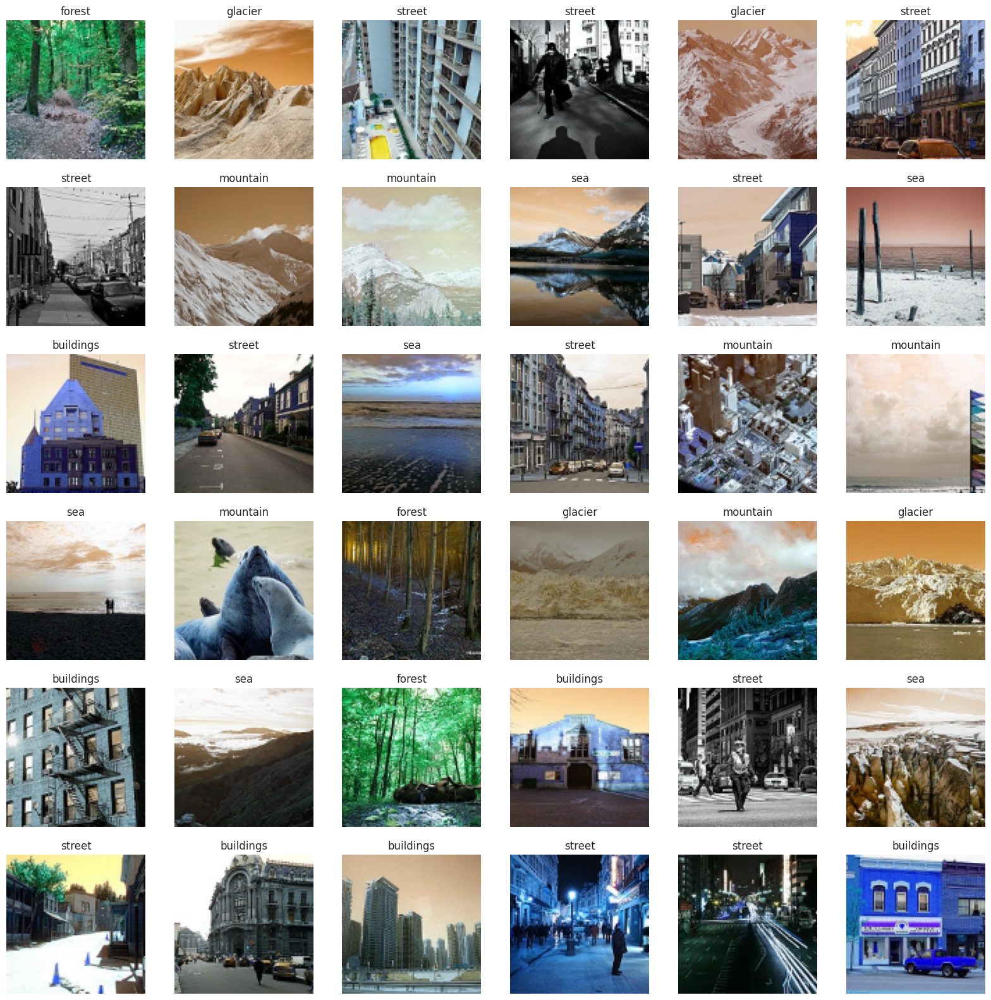

In [31]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(x_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))

# Transfer Learning

In [32]:
from keras.applications.mobilenet_v2 import MobileNetV2

from keras.applications.mobilenet_v2 import preprocess_input

In [33]:
x_train = preprocess_input(x_train)
x_test = preprocess_input(x_test)
x_pred_array = preprocess_input(x_pred_array)

In [34]:
x_train.shape

(14034, 100, 100, 3)

In [35]:
mobilenet_model = MobileNetV2(weights='imagenet',include_top=False,input_shape=(100,100,3))

9406464/9406464 [==============================] - 0s 0us/step


In [36]:
mobilenet_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 100, 100, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 50, 50, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 50, 50, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 50, 50, 32)   0           ['bn_Conv1[0][

In [37]:
# Freeze all layers in the base model
for layer in mobilenet_model.layers:
    layer.trainable = False

In [38]:
mobilenet_model.output_shape[1:]

(4, 4, 1280)

In [39]:
# Add your custom head to the base model
head_model = Sequential()
head_model.add(Flatten(input_shape=mobilenet_model.output_shape[1:]))
head_model.add(Dense(256, activation='relu'))
head_model.add(Dropout(0.5))
head_model.add(Dense(6, activation='softmax'))

In [40]:
# Combine the base model and the head model
mob_model = Sequential()
mob_model.add(mobilenet_model)
mob_model.add(head_model)

In [41]:
mob_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 4, 4, 1280)       2257984   
 ional)                                                          
                                                                 
 sequential_1 (Sequential)   (None, 6)                 5244678   
                                                                 
Total params: 7,502,662
Trainable params: 5,244,678
Non-trainable params: 2,257,984
_________________________________________________________________


In [42]:
# Compile the model
mob_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [43]:
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=2,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.08, # Randomly zoom image 
        width_shift_range=0.08,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.08,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images


datagen.fit(x_train)

In [44]:
train_generator = datagen.flow(x_train, y_train, batch_size=32)

In [45]:
batch_size=32
epochs=50
history = mob_model.fit_generator(
    train_generator,
    epochs=epochs,
    steps_per_epoch=len(x_train) // batch_size,
    validation_data=(x_test, y_test),
    verbose=1
)

Epoch 1/50


/tmp/ipykernel_32/216549857.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = mob_model.fit_generator(


438/438 [==============================] - 43s 91ms/step - loss: 0.9881 - accuracy: 0.7393 - val_loss: 0.4209 - val_accuracy: 0.8557
Epoch 2/50
438/438 [==============================] - 38s 87ms/step - loss: 0.5909 - accuracy: 0.7830 - val_loss: 0.4007 - val_accuracy: 0.8653
Epoch 3/50
438/438 [==============================] - 37s 86ms/step - loss: 0.5522 - accuracy: 0.7983 - val_loss: 0.3521 - val_accuracy: 0.8780
Epoch 4/50
438/438 [==============================] - 38s 87ms/step - loss: 0.5152 - accuracy: 0.8106 - val_loss: 0.3416 - val_accuracy: 0.8847
Epoch 5/50
438/438 [==============================] - 38s 86ms/step - loss: 0.4970 - accuracy: 0.8193 - val_loss: 0.3549 - val_accuracy: 0.8700
Epoch 6/50
438/438 [==============================] - 37s 85ms/step - loss: 0.4812 - accuracy: 0.8252 - val_loss: 0.3496 - val_accuracy: 0.8847
Epoch 7/50
438/438 [==============================] - 38s 86ms/step - loss: 0.4660 - accuracy: 0.8309 - val_loss: 0.3461 - val_accuracy: 0.8730
Epo

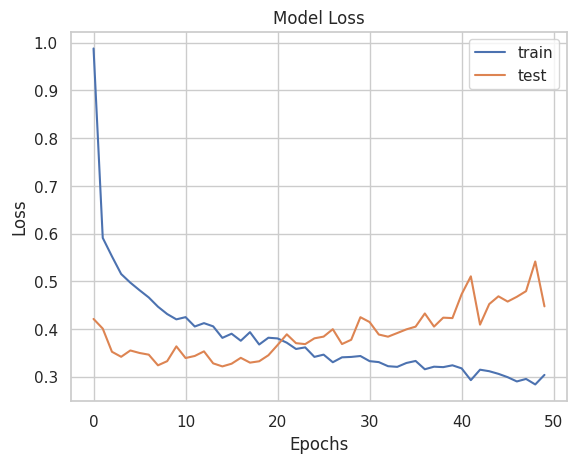

In [46]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

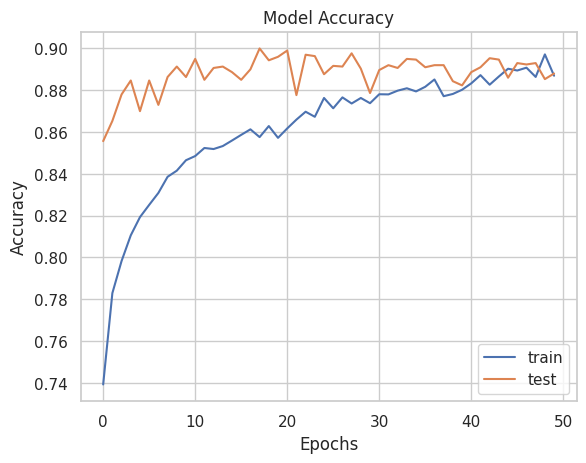

In [47]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

**mobilenetV2 model is better than the first model which has overfitting**

# Thanks